In [1]:
# Import necessary packages
import pandas as pd
import random
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import deepcopy as cp


from sklearn import preprocessing

from sklearn.preprocessing import StandardScaler

# Logistic Regression
from sklearn.linear_model import LogisticRegression

# Neural Network MLP
from sklearn.neural_network import MLPClassifier

from sklearn.base import BaseEstimator, ClassifierMixin

# SVM
from sklearn.svm import SVC

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    RocCurveDisplay
)
# Decision Tree

from sklearn.tree import (
    DecisionTreeClassifier,
    plot_tree
)

from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold)

import importlib
import ML
importlib.reload(ML)

from sklearn.decomposition import PCA
from paretochart.paretochart import pareto

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

sns.set_style("ticks")
sns.set_context("paper")

random_state = 42

### Loading data

In [2]:
data = pd.read_csv("winequalityN.csv")

### Define Classification Parameters

In [3]:
data['category'] = data.apply(lambda x: ML.create_classifier(x,'quality',6), axis=1)

#### Data Analysis and Cleaning

In [4]:
data.isnull().sum().sort_values

<bound method Series.sort_values of type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
category                 0
dtype: int64>

In [5]:
data.dropna(axis=0,inplace=True)

In [6]:
data = data[data['type'] == "white"].copy()

In [7]:
data.drop(columns='type', inplace=True)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4870 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4870 non-null   float64
 1   volatile acidity      4870 non-null   float64
 2   citric acid           4870 non-null   float64
 3   residual sugar        4870 non-null   float64
 4   chlorides             4870 non-null   float64
 5   free sulfur dioxide   4870 non-null   float64
 6   total sulfur dioxide  4870 non-null   float64
 7   density               4870 non-null   float64
 8   pH                    4870 non-null   float64
 9   sulphates             4870 non-null   float64
 10  alcohol               4870 non-null   float64
 11  quality               4870 non-null   int64  
 12  category              4870 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 532.7 KB


In [9]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,category
count,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000
mean,6.855123,0.278071,0.334199,6.394343,0.045771,35.317146,138.340144,0.994026,3.188154,0.489700,10.516772,5.878029,0.216427
std,0.843444,0.100528,0.120915,5.070853,0.021846,17.012967,42.490515,0.002993,0.150902,0.114196,1.231251,0.885699,0.411851
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991720,3.090000,0.410000,9.500000,5.000000,0.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993735,3.180000,0.470000,10.400000,6.000000,0.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000,0.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000,1.000000


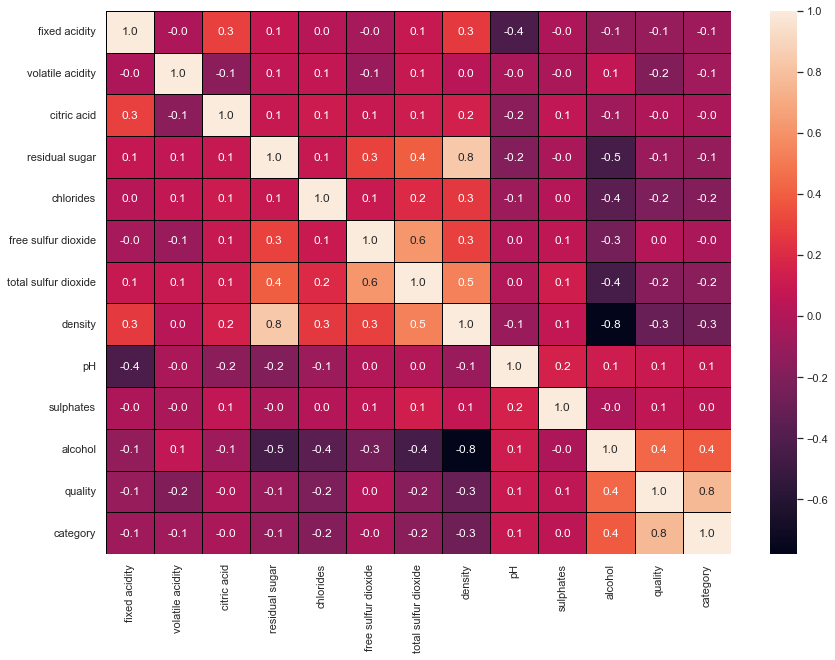

In [10]:
correlation = data.corr()
correlation
sns.set(rc = {'figure.figsize':(14,10)})
plot = sns.heatmap(correlation, annot = True, fmt=".1f", linewidths=1, linecolor='black')
plot;

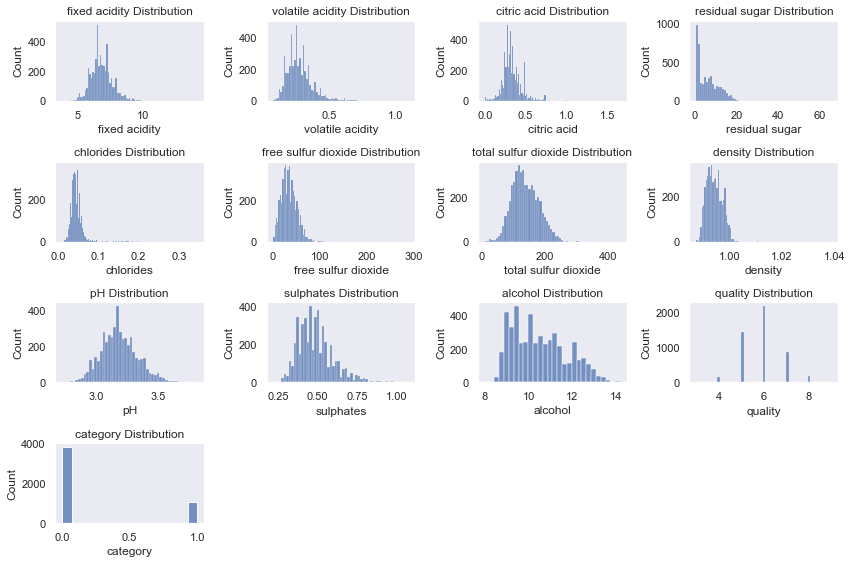

In [11]:
ML.plot_distribution_base(data)

### Define variables 

In [12]:
X = data.drop(['quality', 'category'], axis=1)
y = data['category']

#### PCA Analysis for all data set

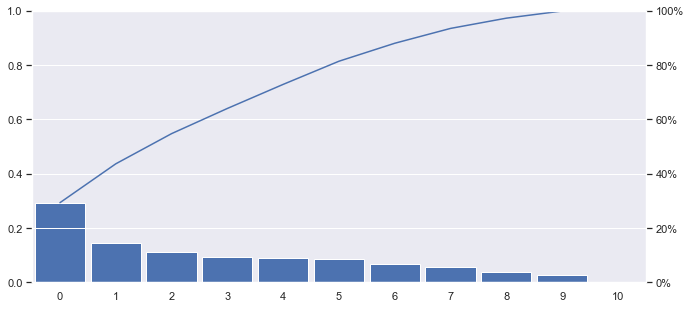

In [13]:
var, var_ratio, num_comp= ML.get_PCA_comp(X)

#### Creation of List to save Model objects created on class

In [14]:
model_name_class =[]

#### Creation of Test Data

In [15]:
X_train_cv, X_test_cv, y_train_cv, y_test_cv = ML.get_train_test(X,y,test_size=0.2, # 20 % da base
                                                          random_state=42)

#### Function to run neural models

In [16]:
def func_neural_nopca(X_train_cv,X_test_cv, y_train_cv,y_test_cv, neuron, transformation='',random_seed=None):

    model_result = ML.train(X_train_cv, X_test_cv, y_train_cv, y_test_cv, ML.MLPClassifierWrapper,
                     n_splits=5, n_init=20, use_pca=False, tag="_n" + str(neuron),
                     transformation=transformation,random_seed=random_seed,input_dim=X_train_cv.shape[1],output_dim=1,output_neurons_activation_function='sigmoid', checkpoint='model_checkpoint.h5',
                     monitor='val_loss',
                     mode='min',
                     n_neuron=neuron,
                     hidden_neurons_activation_function='tanh',
                     epochs=200)
    
    tag_neuron = "_n" + str(neuron)
    variable_name = f'ML_neural_{tag_neuron}'
    globals()[variable_name] = ML.ModelResults(model_result)
    model_name_class.append(globals()[variable_name])

In [17]:
def func_neural_pca(X_train_cv,X_test_cv, y_train_cv,y_test_cv, neuron, transformation='',random_seed=None):

    model_result = ML.train(X_train_cv, X_test_cv, y_train_cv, y_test_cv, ML.MLPClassifierWrapper,
                     n_splits=5, n_init=20, use_pca=True, tag="_n" + str(neuron),
                     transformation=transformation,random_seed=random_seed,input_dim=X_train_cv.shape[1],output_dim=1,output_neurons_activation_function='sigmoid', checkpoint='model_checkpoint.h5',
                     monitor='val_loss',
                     mode='min',
                     n_neuron=neuron,
                     hidden_neurons_activation_function='tanh',
                     epochs=200)
    
    tag_neuron = "_n" + str(neuron)
    variable_name = f'ML_neural_{tag_neuron}'
    globals()[variable_name] = ML.ModelResults(model_result)
    model_name_class.append(globals()[variable_name])

self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 632us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 521us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 961us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 517us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 649us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 522us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 636us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 531us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 700us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 6

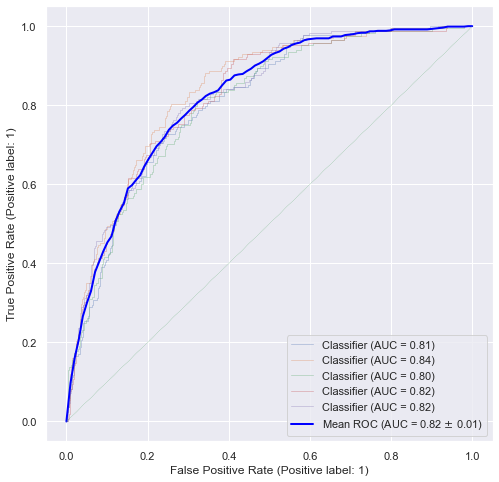

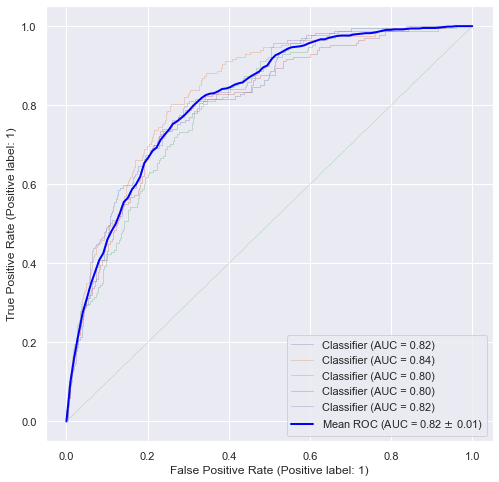

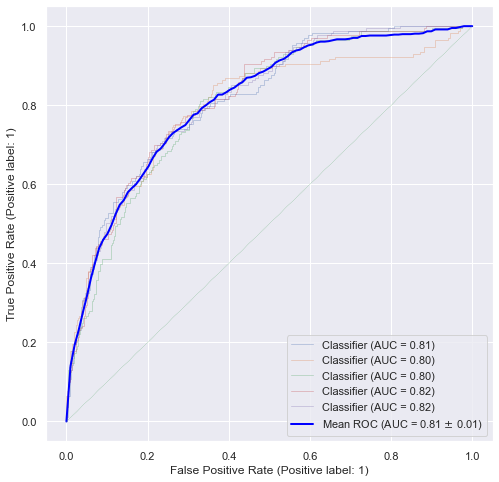

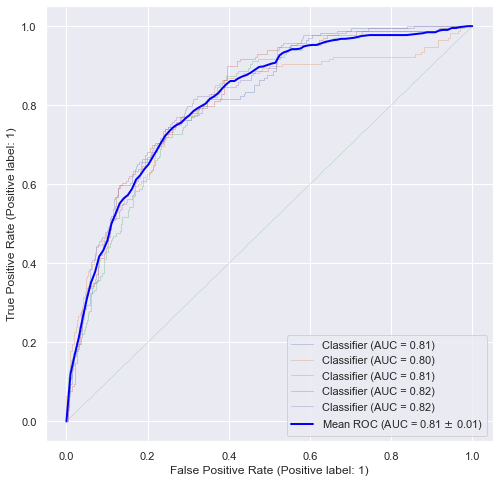

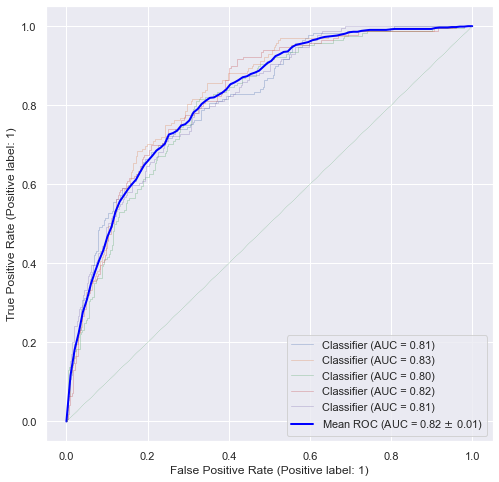

...

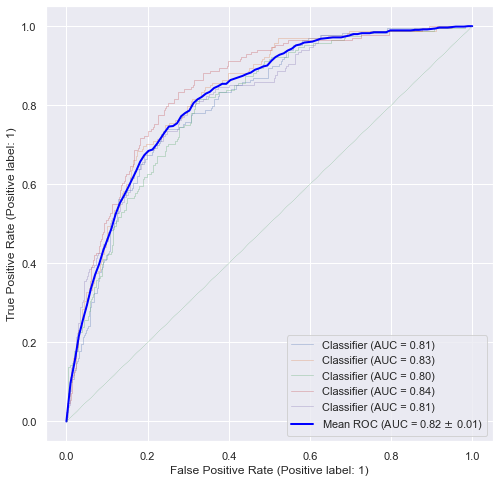

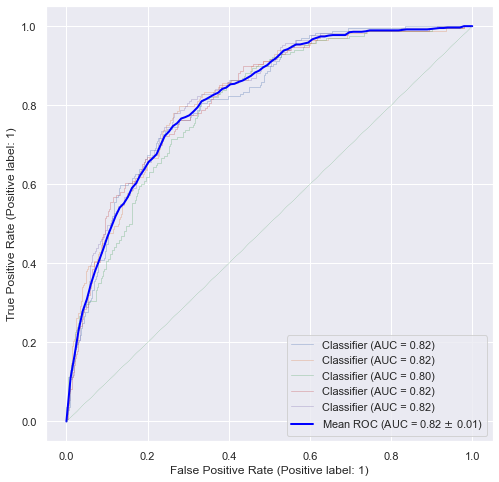

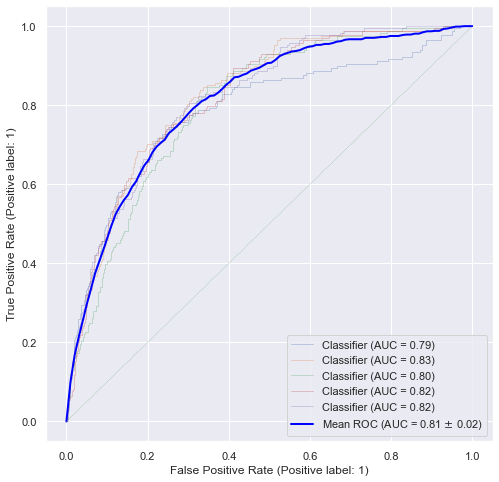

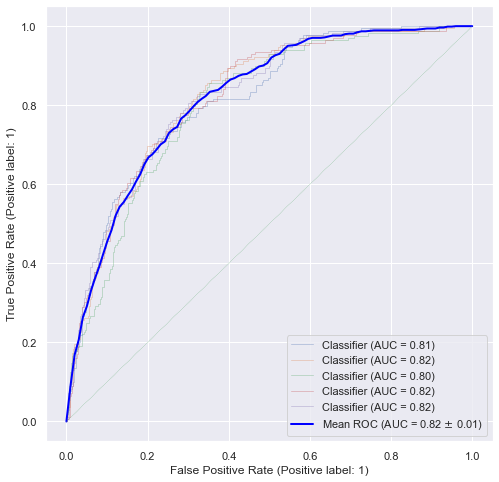

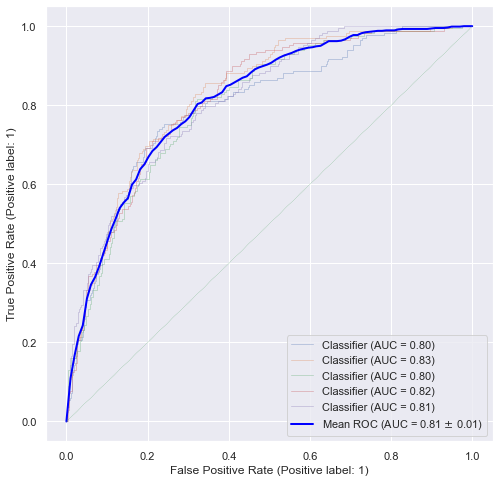

In [18]:
for neuron in range(1,15):
    func_neural_nopca(X_train_cv,X_test_cv, y_train_cv,y_test_cv,neuron, random_seed=123)


The number of components required to explain 80% of the variance for this model was 5
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 913us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 651us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 651us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 650us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 649us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 651us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 734us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 650us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 650us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 479us/step
self

c:\Users\DOUGL\Documents\Bootcamp\DouglasOliveiraSousa_RedesNeurais\ML (1)\ML\ML.py:211: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(11, 5))


25/25 [==============================] - 0s 641us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 682us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 556us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 574us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 516us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 727us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 739us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 699us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 848us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 651us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 620us/step
self.n_neurons: 2
self.input_dim: 5

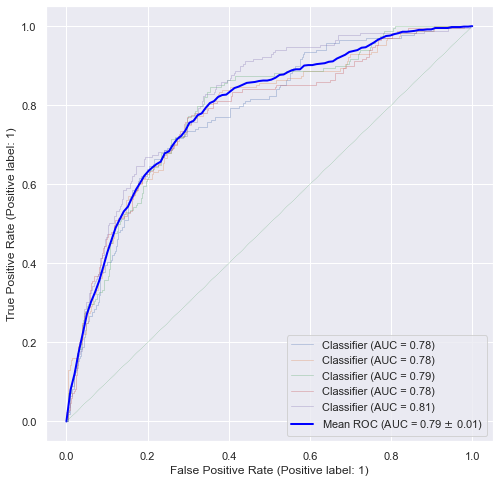

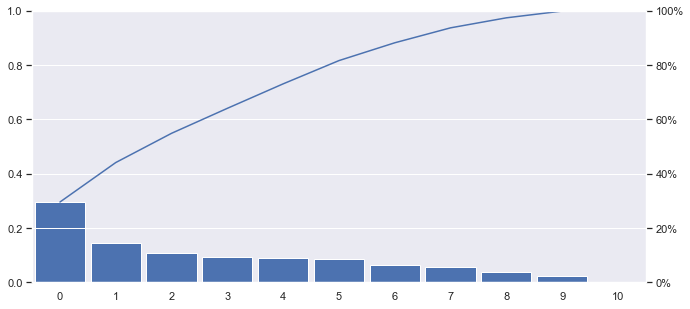

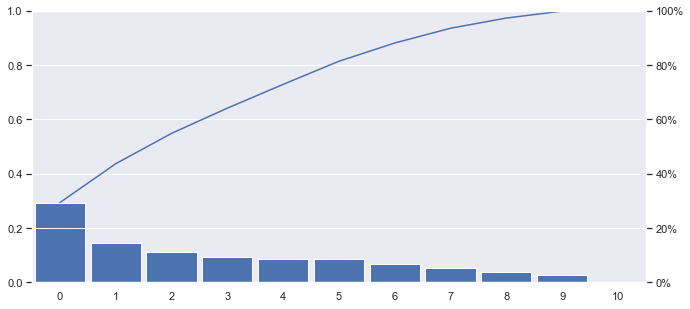

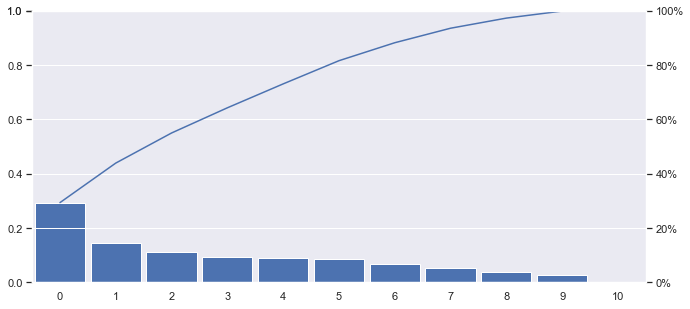

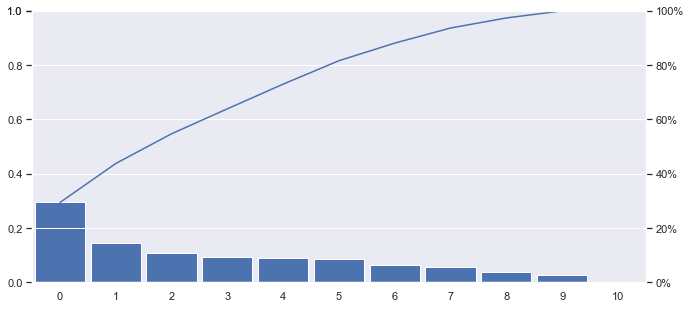

...

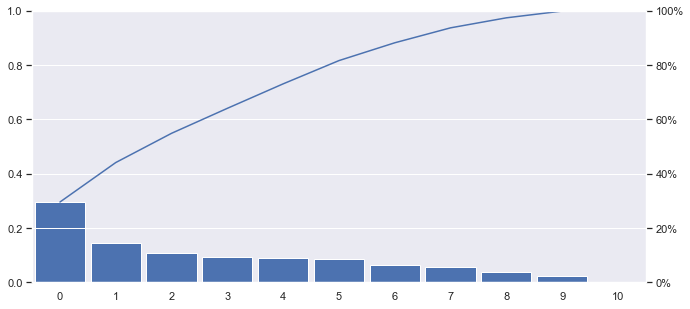

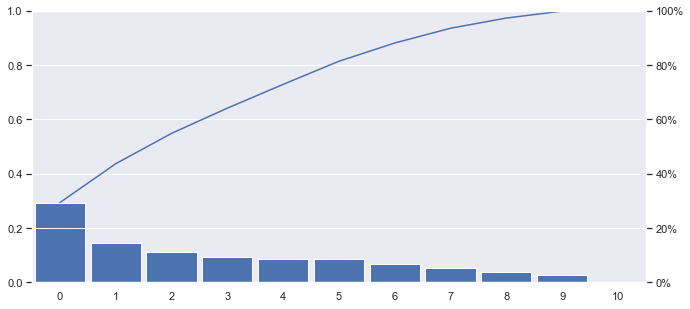

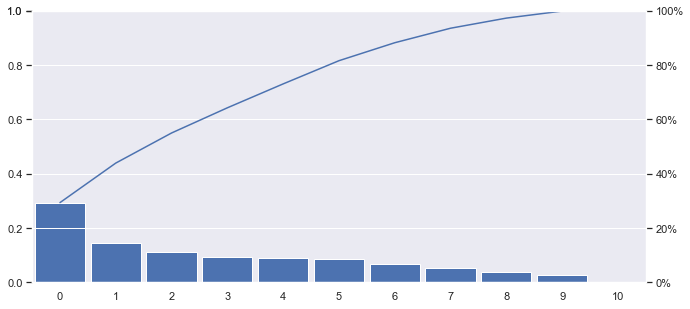

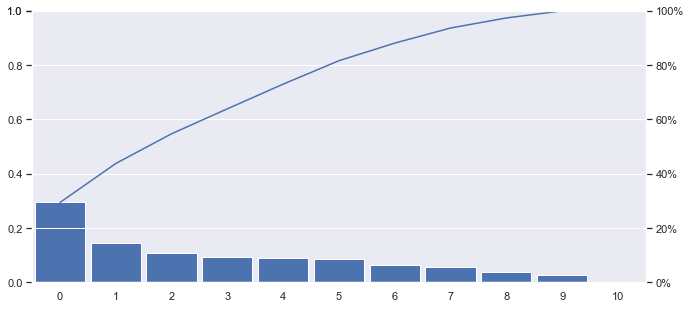

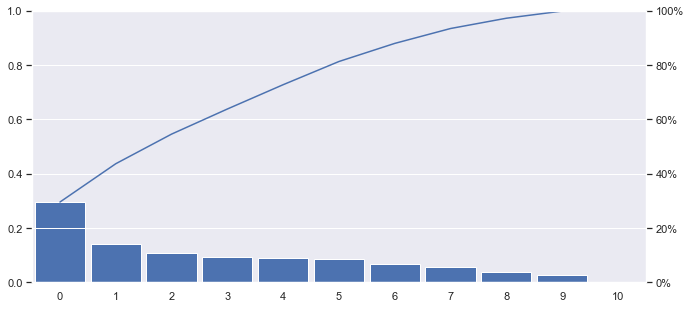

In [19]:
for neuron in range(1,15):
    func_neural_pca(X_train_cv,X_test_cv, y_train_cv,y_test_cv,neuron, random_seed=123)

#### Implementation of Different Models With Log transformation

In [20]:
X['residual sugar']

0       20.7
1        1.6
2        6.9
3        8.5
4        8.5
        ... 
4891     0.9
4893     1.6
4894     8.0
4896     1.1
4897     0.8
Name: residual sugar, Length: 4870, dtype: float64

In [21]:
X['residual_sugar_log']=ML.log_transform(X['residual sugar'])

In [22]:
Xlog=X.drop(columns='residual sugar')

In [23]:
X_train_cv_log, X_test_cv_log, y_train_cv_log, y_test_cv_log = ML.get_train_test(Xlog,y,test_size=0.2, # 20 % da base
                                                           random_state=42)

The number of components required to explain 80% of the variance for this model was 5
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 507us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 544us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 588us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 556us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 546us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 459us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 626us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 505us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 589us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 552us/step
self

c:\Users\DOUGL\Documents\Bootcamp\DouglasOliveiraSousa_RedesNeurais\ML (1)\ML\ML.py:211: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(11, 5))


25/25 [==============================] - 0s 589us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 549us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 458us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 579us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 542us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 625us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 625us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 542us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 584us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 592us/step
self.n_neurons: 2
self.input_dim: 5
25/25 [==============================] - 0s 547us/step
self.n_neurons: 2
self.input_dim: 5

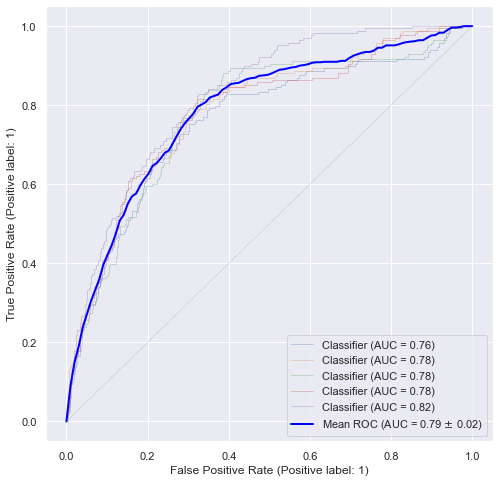

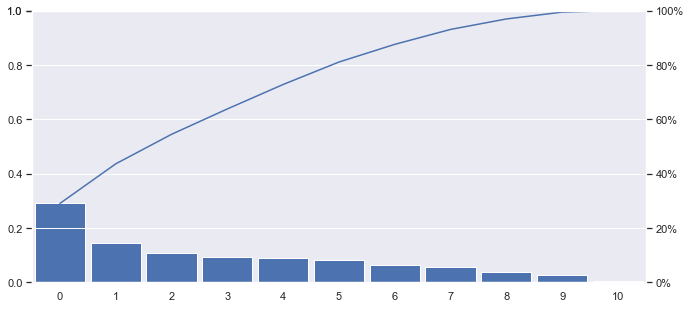

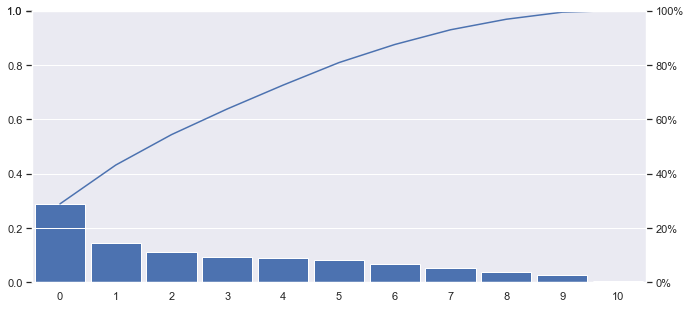

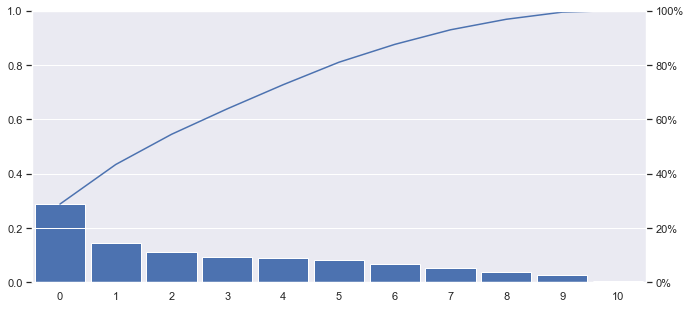

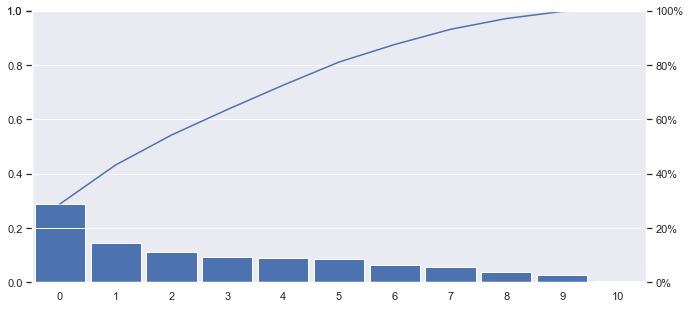

...

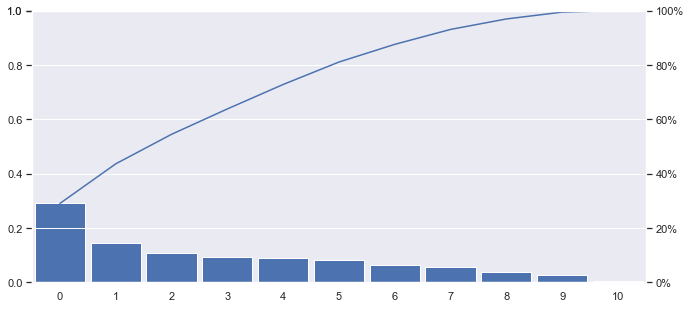

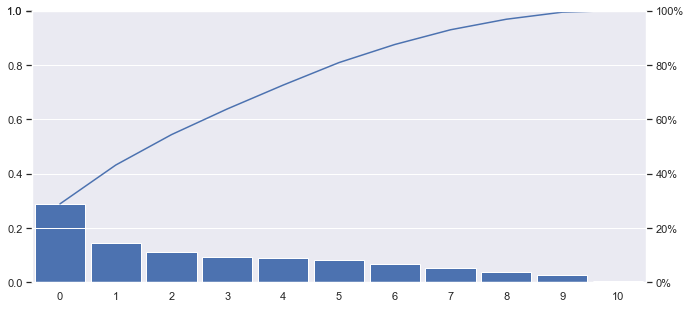

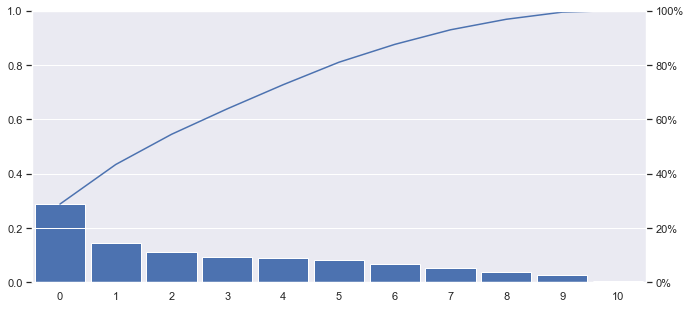

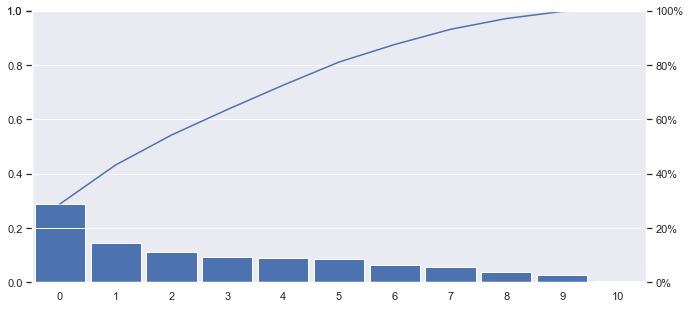

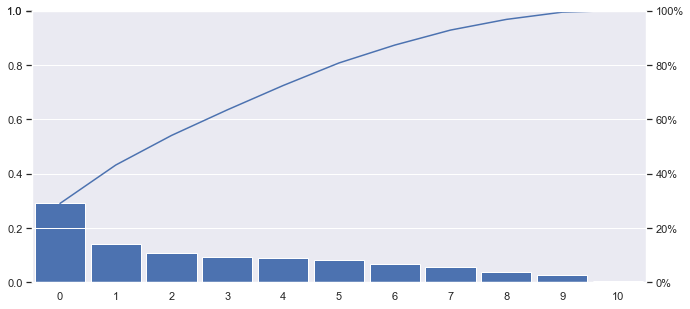

In [24]:
for neuron in range(1,15):
    func_neural_pca(X_train_cv_log, X_test_cv_log, y_train_cv_log,y_test_cv_log,neuron,'log',random_seed=123)

self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 521us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 500us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 584us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 588us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 496us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 625us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 625us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 616us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 587us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 577us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s

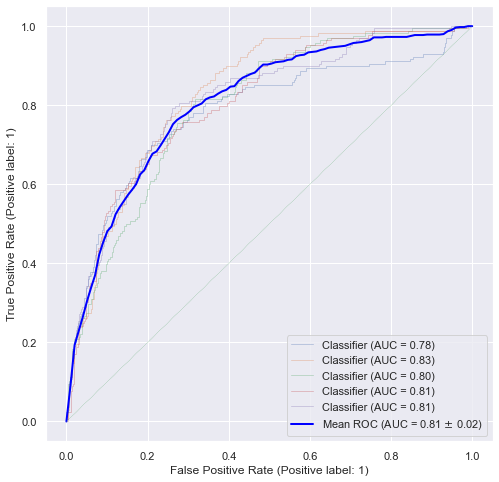

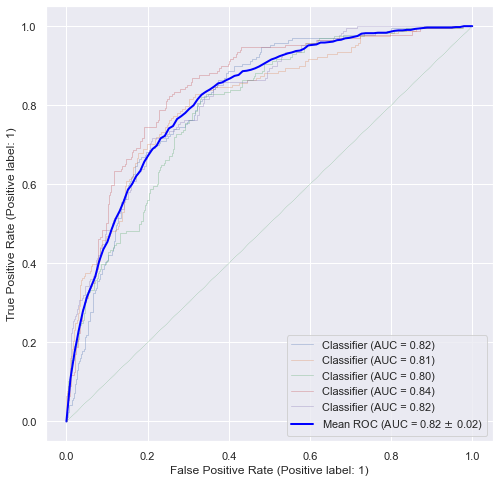

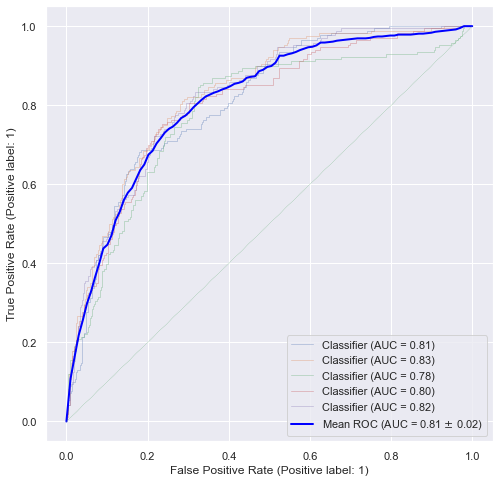

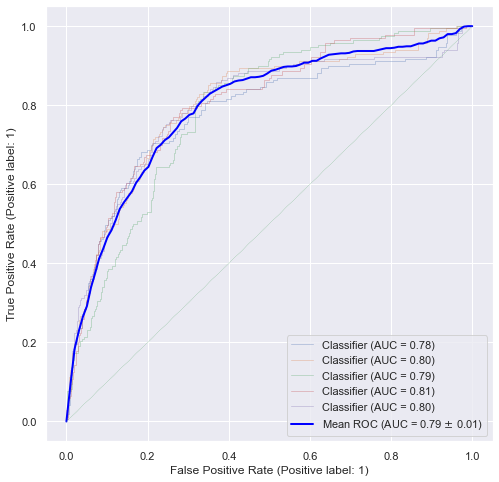

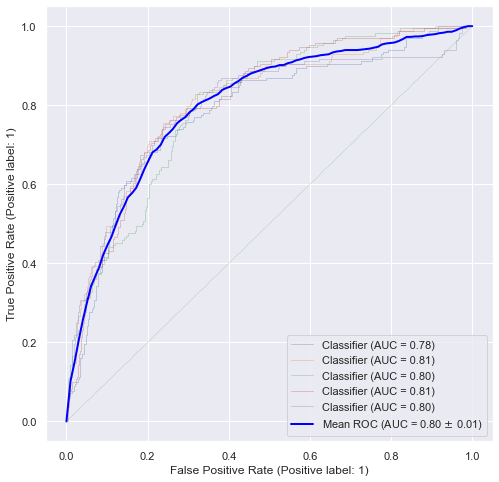

...

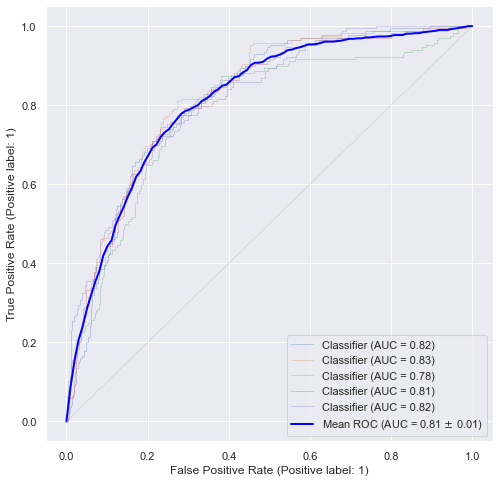

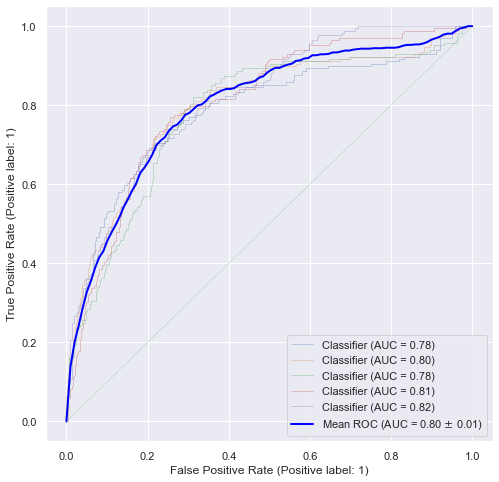

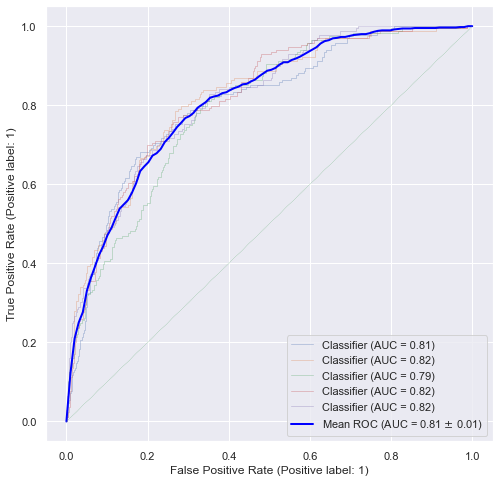

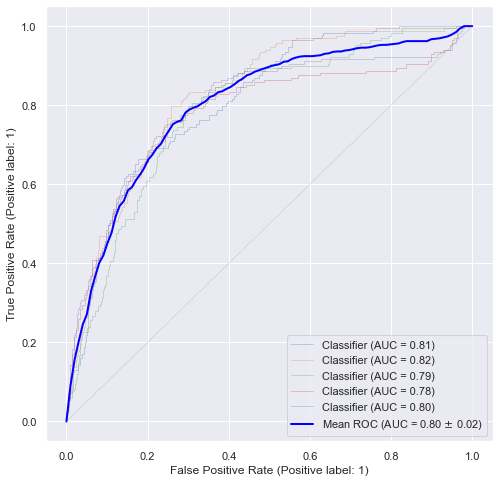

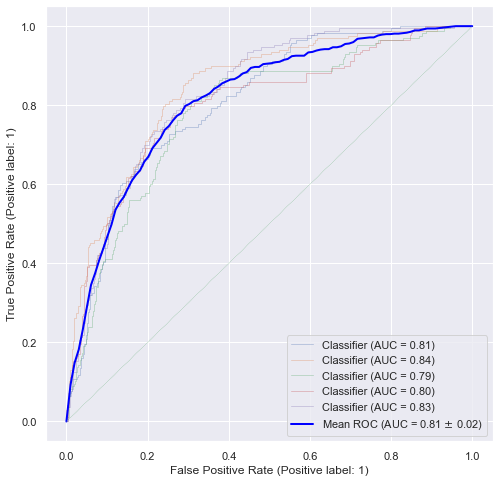

In [25]:
for neuron in range(1,15):
    func_neural_nopca(X_train_cv_log, X_test_cv_log, y_train_cv_log,y_test_cv_log,neuron,'log',random_seed=123)

#### Implementation of Different Models With L2 normalization

In [26]:
x_train_cv_l2, x_test_cv_l2=ML.normalize_L1_L2(X_train_cv, X_test_cv,'l2')

The number of components required to explain 80% of the variance for this model was 2
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 550us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 475us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 547us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 627us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 548us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 565us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 669us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 648us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 550us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 507us/step
self

c:\Users\DOUGL\Documents\Bootcamp\DouglasOliveiraSousa_RedesNeurais\ML (1)\ML\ML.py:211: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(11, 5))


25/25 [==============================] - 0s 583us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 621us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 563us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 624us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 633us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 736us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 586us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 574us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 752us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 773us/step
self.n_neurons: 2
self.input_dim: 2
25/25 [==============================] - 0s 623us/step
self.n_neurons: 2
self.input_dim: 2

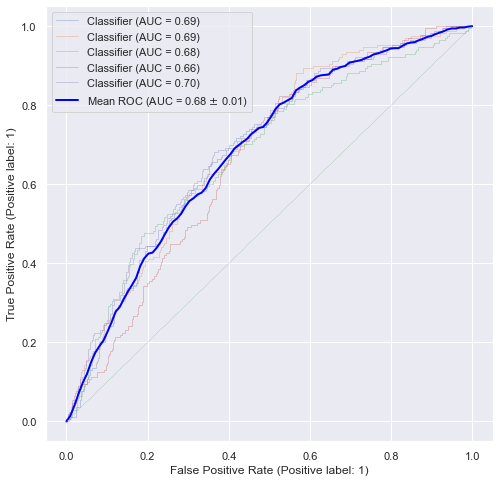

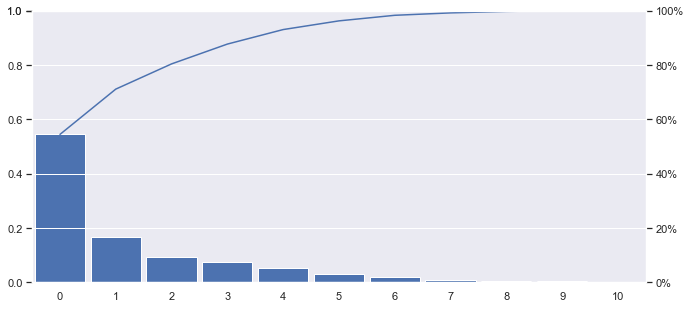

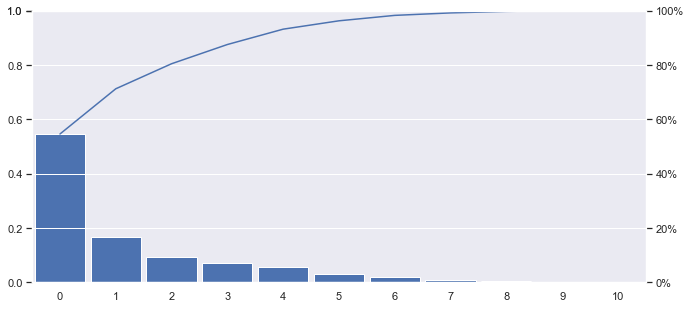

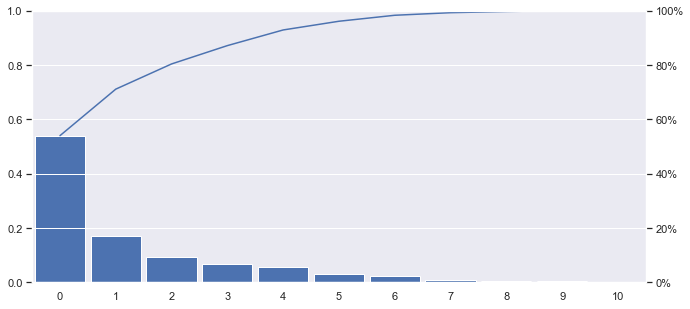

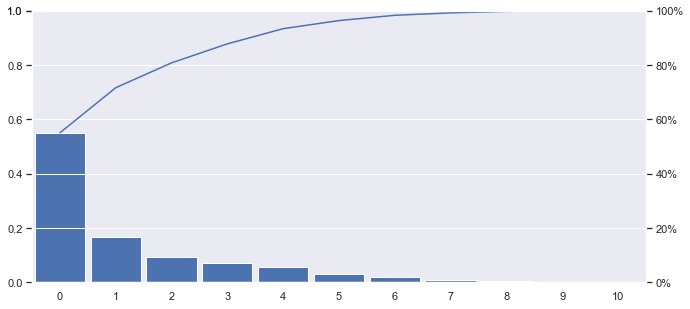

...

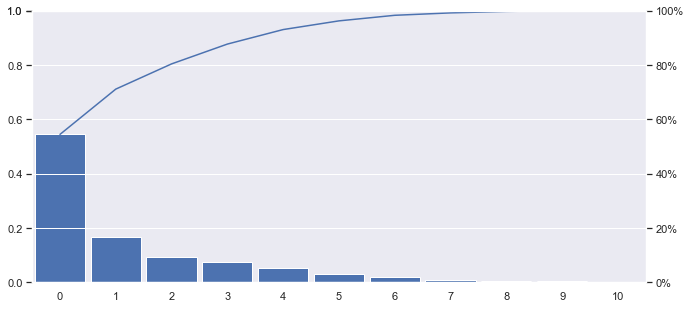

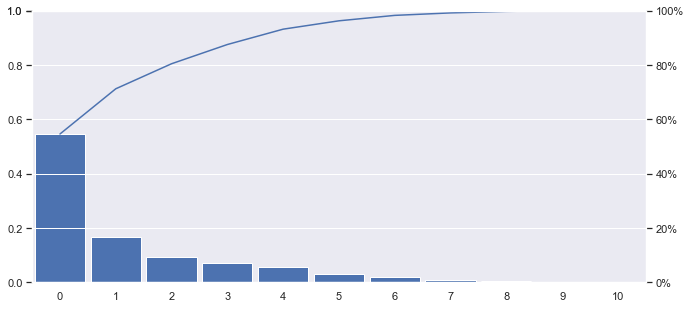

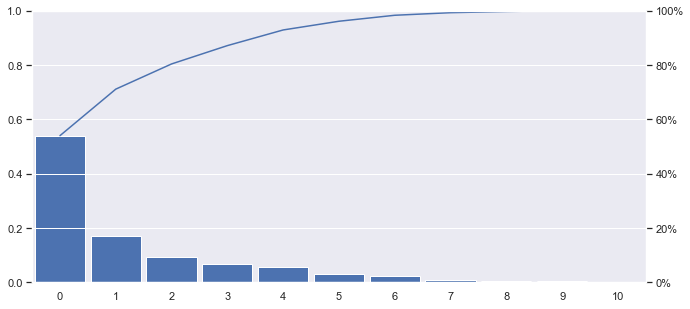

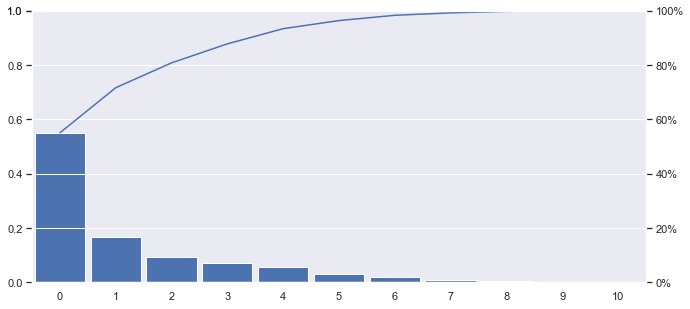

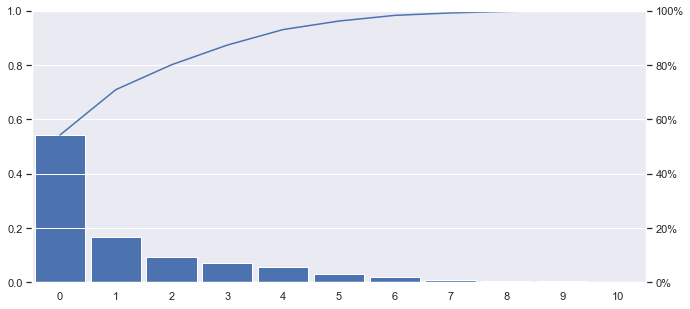

In [27]:
for neuron in range(1,15):
    func_neural_pca(x_train_cv_l2, x_test_cv_l2, y_train_cv,y_test_cv,neuron,'L2',random_seed=123)

self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 295us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 972us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 643us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 628us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 679us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 765us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 87us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 784us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 209us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 886us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 

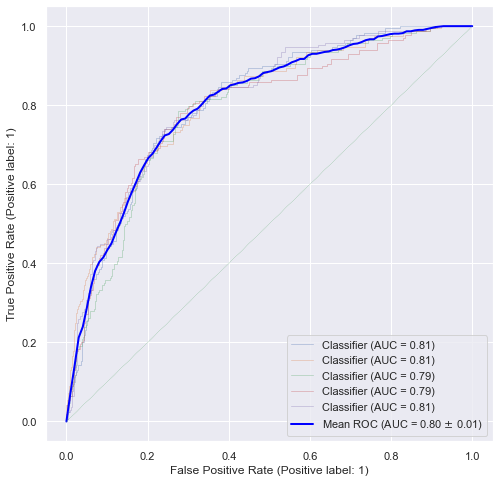

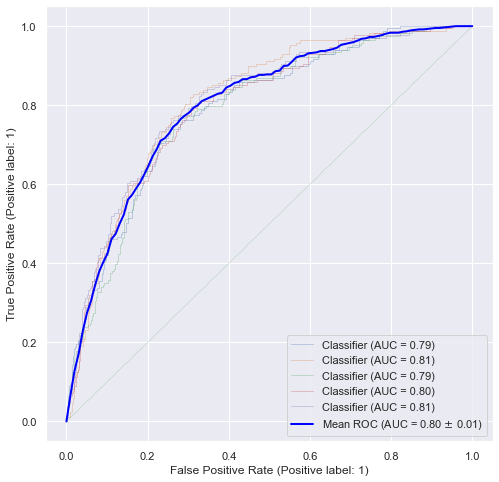

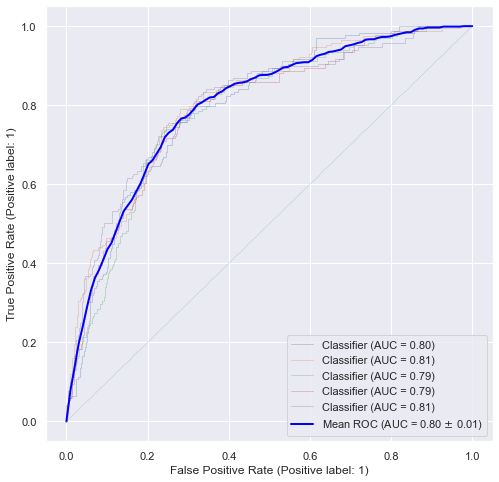

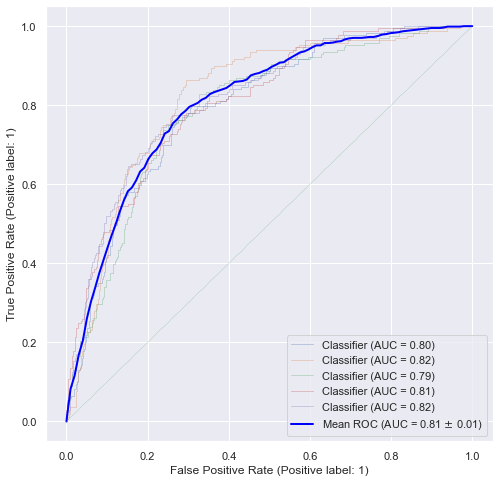

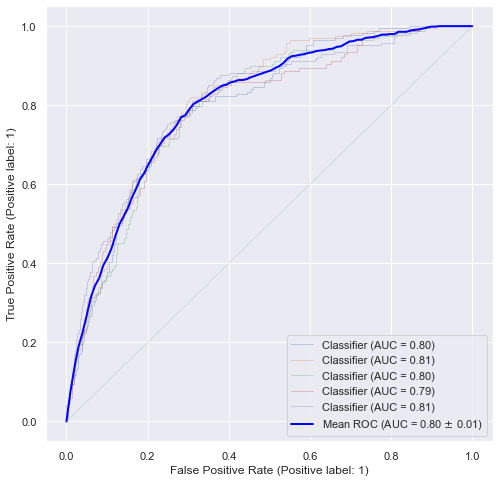

...

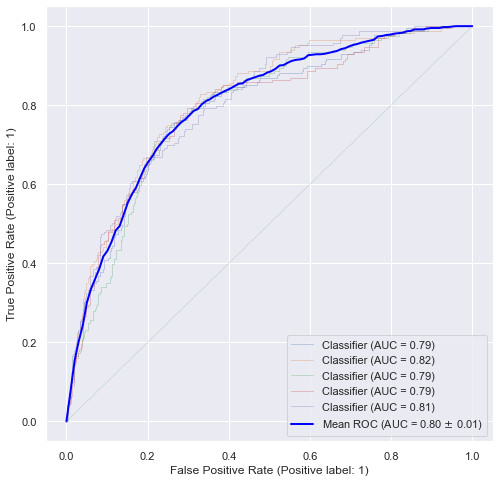

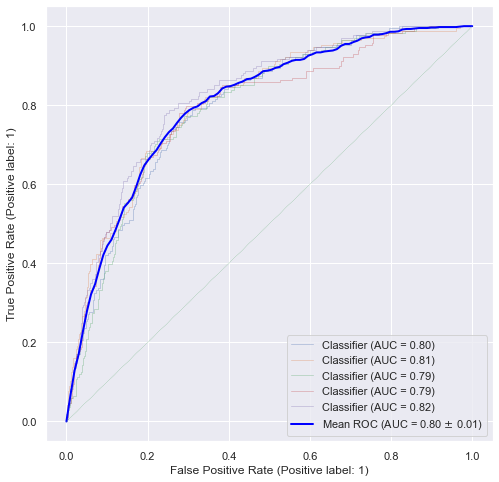

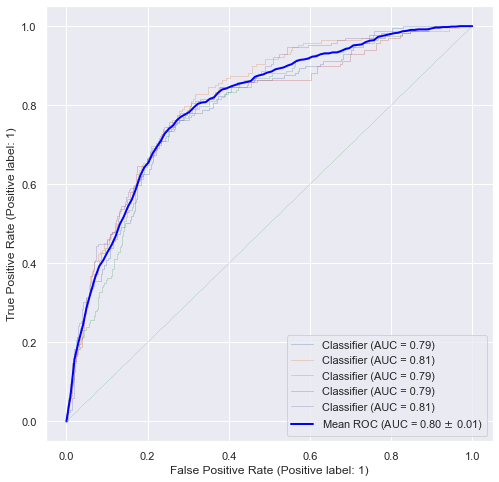

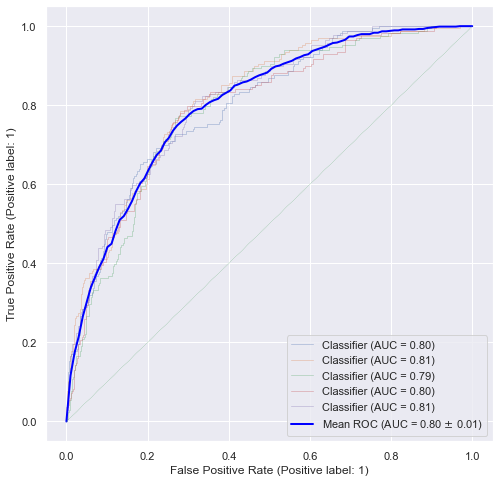

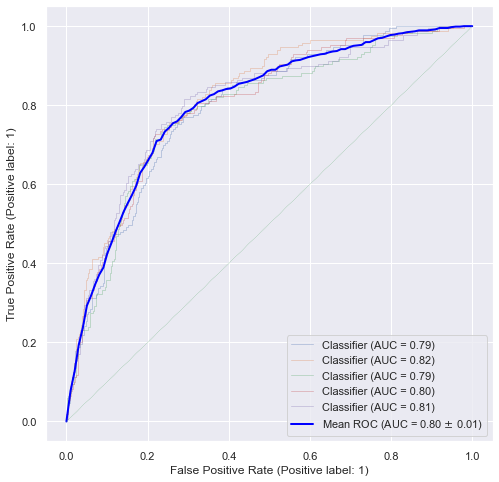

In [28]:
for neuron in range(1,15):
    func_neural_nopca(x_train_cv_l2, x_test_cv_l2, y_train_cv,y_test_cv,neuron,'L2',random_seed=123)

#### Implementation of Different Models With L1 normalization

In [29]:
x_train_cv_l1, x_test_cv_l1=ML.normalize_L1_L2(X_train_cv, X_test_cv, 'l1')

The number of components required to explain 80% of the variance for this model was 3
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 253us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 703us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 295us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 365us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 295us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 500us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 171us/step
self.n_neu

c:\Users\DOUGL\Documents\Bootcamp\DouglasOliveiraSousa_RedesNeurais\ML (1)\ML\ML.py:211: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(11, 5))


25/25 [==============================] - 0s 713us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 587us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 942us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 835us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 171us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 462us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 47us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 378us/step
self.n_neurons: 2
self.input_dim: 3
25/25 [==============================] - 0s 0s/step
self.n_neurons: 2
self.input_dim: 3
25/25 [

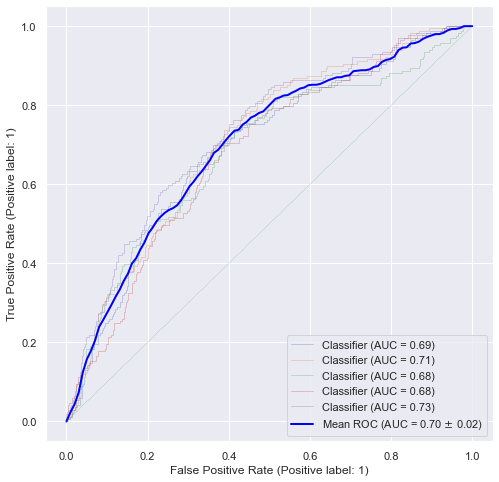

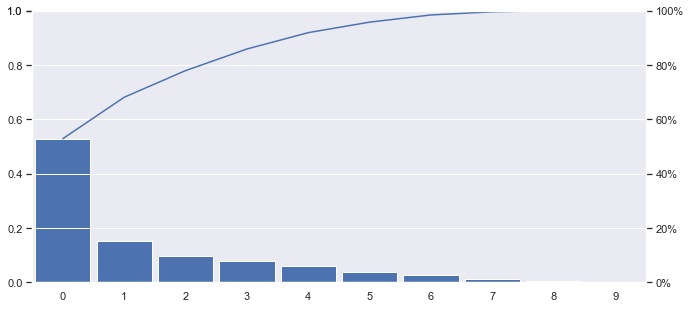

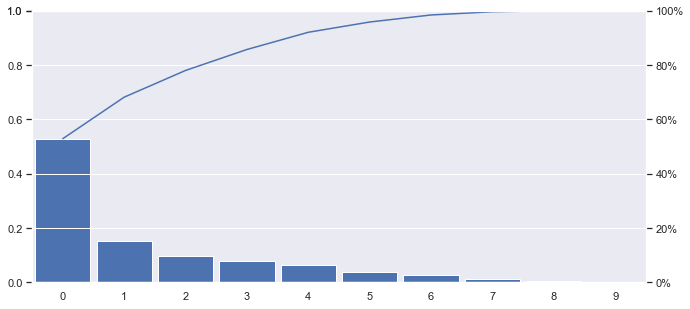

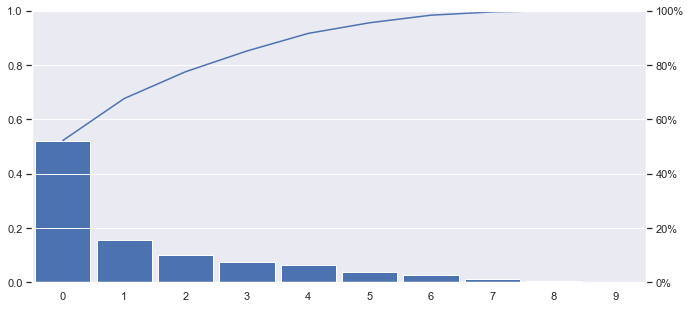

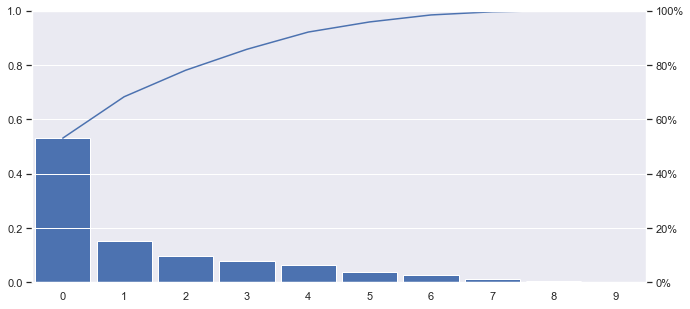

...

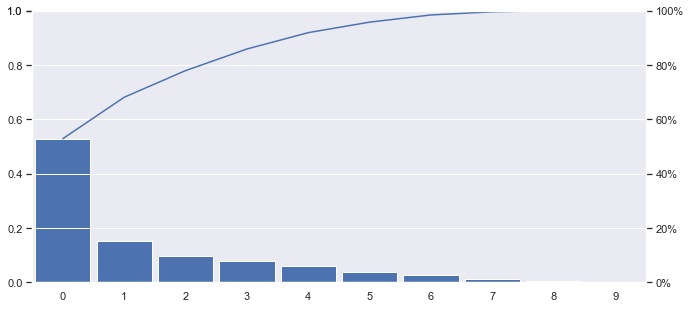

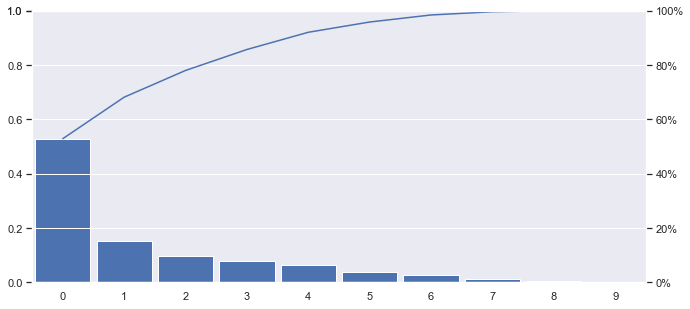

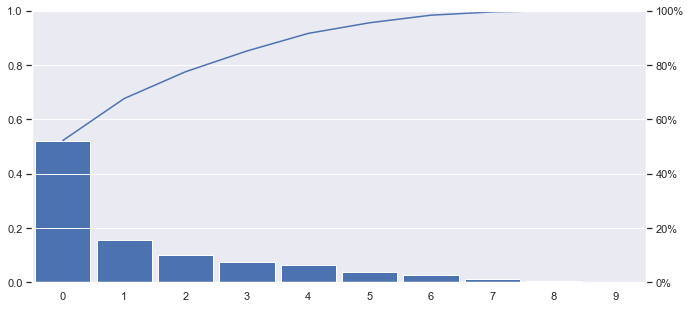

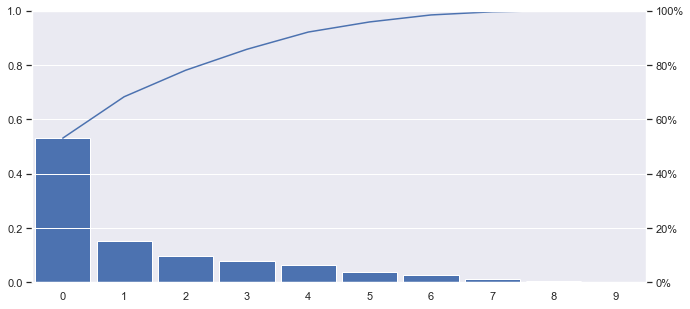

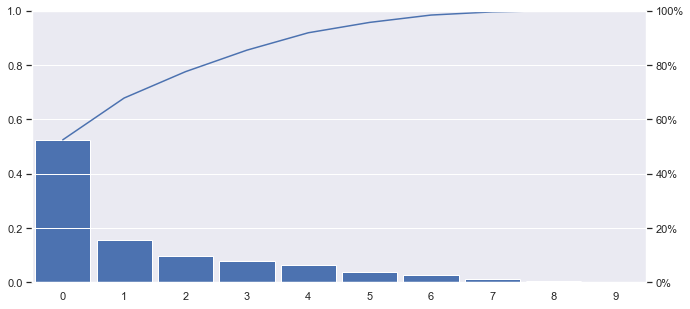

In [30]:
for neuron in range(1,15):
    func_neural_pca(x_train_cv_l1, x_test_cv_l1, y_train_cv,y_test_cv,neuron,'L1',random_seed=123)

self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 1ms/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 45us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 43us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 660us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 46us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 611us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 881us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 844us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 852us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 295us/step
self.n_neurons: 2
self.input_dim: 11
25/25 [==============================] - 0s 378u

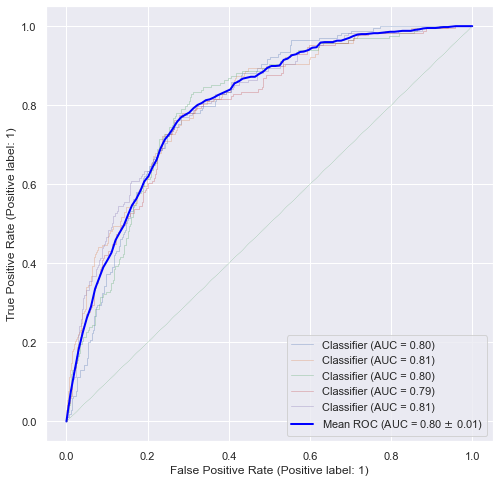

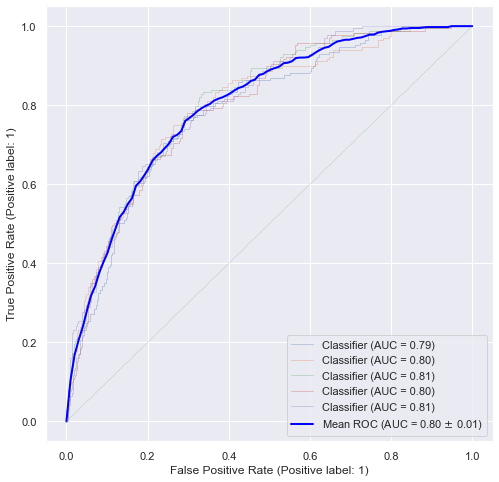

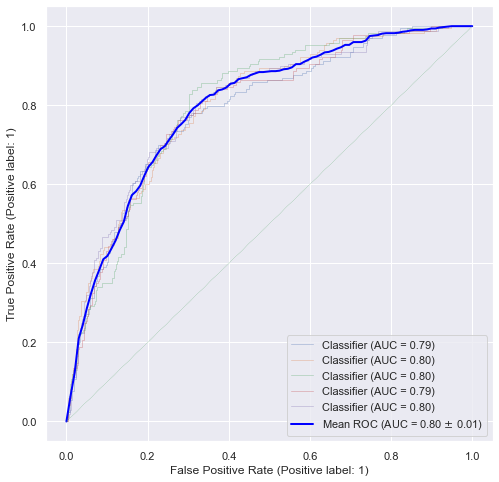

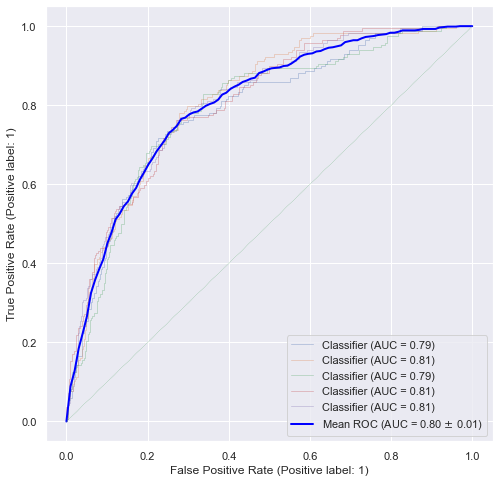

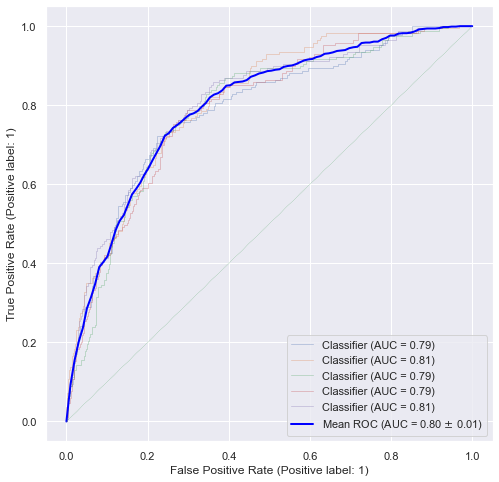

...

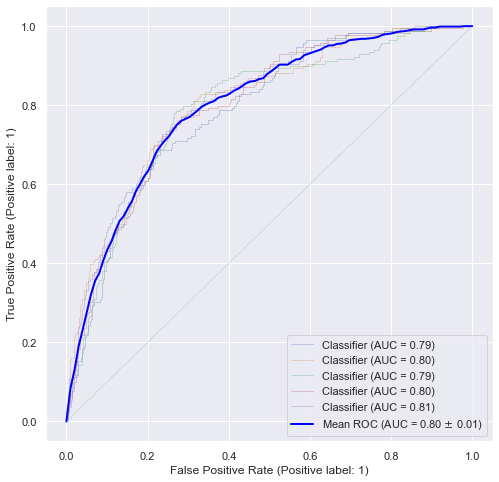

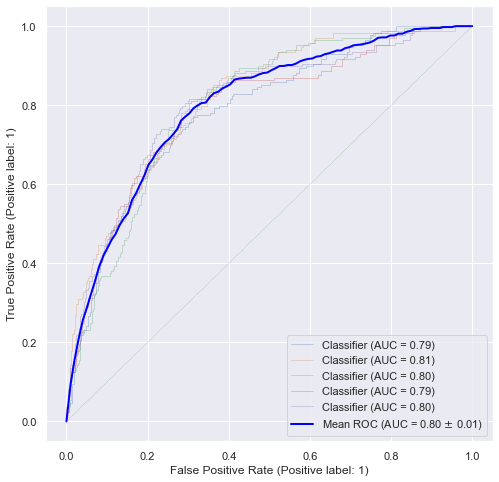

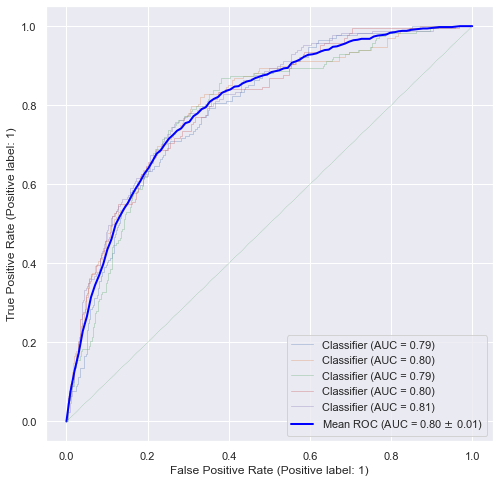

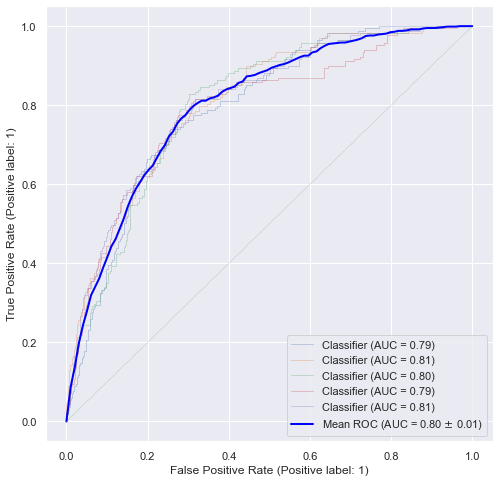

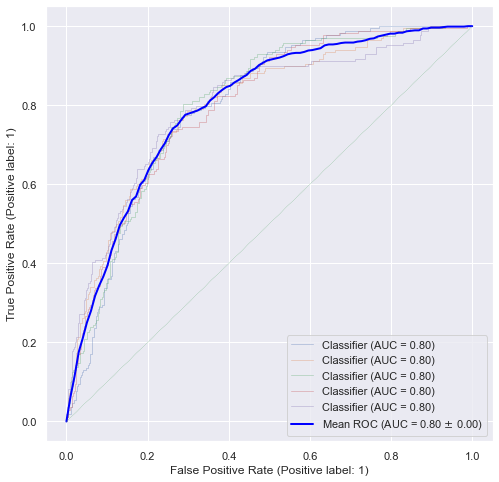

In [31]:
for neuron in range(1,15):
    func_neural_nopca(x_train_cv_l1, x_test_cv_l1, y_train_cv,y_test_cv,neuron,'L1',random_seed=123)

#### Final Results Analysis

In [32]:
result, nopca, pca =ML.get_validation_info(model_name_class)

31/31 [==============================] - 0s 855us/step


In [1]:
model_name_class

NameError: name 'model_name_class' is not defined

In [34]:
result

,Model,Precision,Sensitivity,Validation F1,Validation F1 deviation,Precision PCA,Sensitivity PCA,Validation F1 PCA,Validation F1 deviation PCA
0,MLPClassifierWrapper_model_n1,56.0811 %,39.3365 %,0.793231,0.008673,56.2500 %,34.1232 %,0.775732,0.005997
1,MLPClassifierWrapper_model_n2,55.2632 %,39.8104 %,0.791418,0.009603,55.6452 %,32.7014 %,0.775656,0.004530
2,MLPClassifierWrapper_model_n3,56.9231 %,35.0711 %,0.795687,0.006753,63.3663 %,30.3318 %,0.773544,0.006513
3,MLPClassifierWrapper_model_n4,55.0336 %,38.8626 %,0.794353,0.007064,54.7009 %,30.3318 %,0.776294,0.006522
4,MLPClassifierWrapper_model_n5,56.1538 %,34.5972 %,0.790992,0.004109,52.7132 %,32.2275 %,0.777766,0.011706
5,MLPClassifierWrapper_model_n6,56.5574 %,32.7014 %,0.790416,0.007844,55.8824 %,36.0190 %,0.777661,0.010077
6,MLPClassifierWrapper_model_n7,55.6291 %,39.8104 %,0.796450,0.014218,55.6291 %,39.8104 %,0.775684,0.009078
7,MLPClassifierWrapper_model_n8,58.9928 %,38.8626 %,0.790122,0.007625,56.0284 %,37.4408 %,0.775643,0.012458
8,MLPClassifierWrapper_model_n9,55.8621 %,38.3886 %,0.788794,0.009454,56.5217 %,36.9668 %,0.773028,0.010860
9,MLPClassifierWrapper_model_n10,58.0153 %,36.0190 %,0.791481,0.006741,59.1304 %,32.2275 %,0.774241,0.005706


In [35]:
result.describe

<bound method NDFrame.describe of                                 Model   Precision Sensitivity  Validation F1  \
0       MLPClassifierWrapper_model_n1   56.0811 %   39.3365 %       0.793231   
1       MLPClassifierWrapper_model_n2   55.2632 %   39.8104 %       0.791418   
2       MLPClassifierWrapper_model_n3   56.9231 %   35.0711 %       0.795687   
3       MLPClassifierWrapper_model_n4   55.0336 %   38.8626 %       0.794353   
4       MLPClassifierWrapper_model_n5   56.1538 %   34.5972 %       0.790992   
5       MLPClassifierWrapper_model_n6   56.5574 %   32.7014 %       0.790416   
6       MLPClassifierWrapper_model_n7   55.6291 %   39.8104 %       0.796450   
7       MLPClassifierWrapper_model_n8   58.9928 %   38.8626 %       0.790122   
8       MLPClassifierWrapper_model_n9   55.8621 %   38.3886 %       0.788794   
9      MLPClassifierWrapper_model_n10   58.0153 %   36.0190 %       0.791481   
10     MLPClassifierWrapper_model_n11   56.2914 %   40.2844 %       0.792625   
11    

In [36]:
result['Model']

0         MLPClassifierWrapper_model_n1
1         MLPClassifierWrapper_model_n2
2         MLPClassifierWrapper_model_n3
3         MLPClassifierWrapper_model_n4
4         MLPClassifierWrapper_model_n5
5         MLPClassifierWrapper_model_n6
6         MLPClassifierWrapper_model_n7
7         MLPClassifierWrapper_model_n8
8         MLPClassifierWrapper_model_n9
9        MLPClassifierWrapper_model_n10
10       MLPClassifierWrapper_model_n11
11       MLPClassifierWrapper_model_n12
12       MLPClassifierWrapper_model_n13
13       MLPClassifierWrapper_model_n14
14     MLPClassifierWrapper_model_n1log
15     MLPClassifierWrapper_model_n2log
16     MLPClassifierWrapper_model_n3log
17     MLPClassifierWrapper_model_n4log
18     MLPClassifierWrapper_model_n5log
19     MLPClassifierWrapper_model_n6log
20     MLPClassifierWrapper_model_n7log
21     MLPClassifierWrapper_model_n8log
22     MLPClassifierWrapper_model_n9log
23    MLPClassifierWrapper_model_n10log
24    MLPClassifierWrapper_model_n11log


In [37]:
result.shape[0]

56

In [38]:
result.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54, 55],
           dtype='int64')

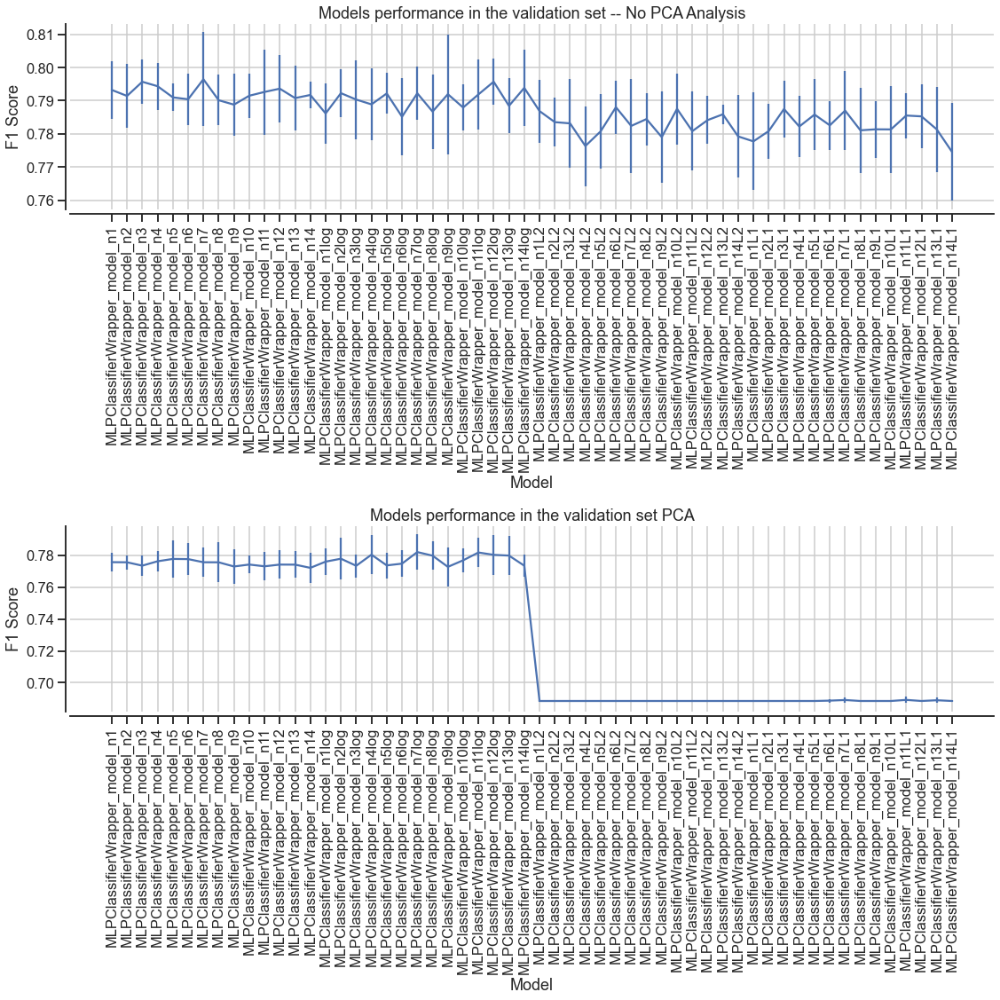

In [39]:
ML.plot_final_results(result)

31/31 [==============================] - 0s 1ms/step


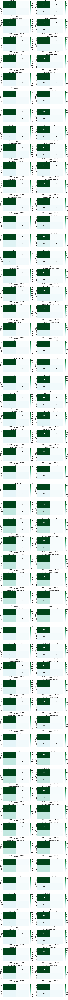

In [40]:
num_plots = len(model_name_class)
num_rows = (num_plots + 1) // 2

fig = plt.figure(figsize=(20, num_rows*5))

for i, model in enumerate(model_name_class):
    ax = fig.add_subplot(num_rows, 2, i+1)
    model.correlation_matrix_test(ax=ax)
    ax.set_title(model.model_name)

plt.tight_layout()
plt.show()

31/31 [==============================] - 0s 203us/step


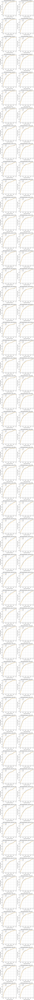

In [41]:
ML.roc_auc_models(model_name_class)

In [42]:
# tf.keras.callbacks.EarlyStopping(
#     monitor="val_loss",
#     min_delta=0,
#     patience=0,
#     verbose=0,
#     mode="auto",
#     baseline=None,
#     restore_best_weights=False,
#     start_from_epoch=0,
# )